<a href="https://colab.research.google.com/github/Ikeda33/codespaces-railstutorial/blob/main/original_vit_50epoch_flower_D_v_G_sa_FID_KID_devide_1_color_relativistic1_hinge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#パッケージのダウンロード


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import argparse

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

In [ ]:
import torchvision.transforms as transforms

In [ ]:
import torchvision.datasets as dset

In [ ]:
import torchvision.utils as vutils

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tqdm

In [ ]:
import glob

In [ ]:
from torch.utils.data import Dataset
from PIL import Image

In [ ]:
from torch.utils.data import DataLoader
import torchvision

In [ ]:
!pip install torchmetrics
!pip install torchmetrics[image]

!pip install torch-fidelity

from torchmetrics.image.inception import InceptionScore


import torchmetrics
import torch_fidelity

import torch
_ = torch.manual_seed(123)
from torchmetrics.image.fid import FrechetInceptionDistance
fid = FrechetInceptionDistance(feature=2048)

from torchmetrics.image.kid import KernelInceptionDistance


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 10.3 MB/s eta 0:00:00


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:01<00:00, 74.1MB/s]


In [ ]:
kid = KernelInceptionDistance(subset_size=15)

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [ ]:
#ハイパーパラメータの設定

In [ ]:
parser = argparse.ArgumentParser()
parser.add_argument("--n_epoch", type = int, default=50)
parser.add_argument("--batch_size", type = int, default=32)
parser.add_argument("--lr_g", type = float, default=2e-4)
parser.add_argument("--lr_d", type = float, default=3e-4)
parser.add_argument("--nch_g", type = int, default=128)
parser.add_argument("--nch_d", type = int, default=128)
parser.add_argument("--z_dim", type = int, default=100)
parser.add_argument("--beta1", type = float, default=0.5)

opt = parser.parse_args(args=[])
print(opt)

Namespace(n_epoch=50, batch_size=32, lr_g=0.0002, lr_d=0.0003, nch_g=128, nch_d=128, z_dim=100, beta1=0.5)


In [ ]:
class ImageDataset(Dataset):
    def __init__(self,  transform = None):
        super().__init__()
        self.file_list = glob.glob("/content/drive/MyDrive/102flowers (2)/jpg/*.jpg")#/content/drive/MyDrive/img_align_celeba.zip
        #self.file_list = glob.glob("/content/drive/MyDrive/cityscapes/cityscapes_data/train/*.jpg" )#/content/drive/MyDrive/cityscapes/cityscapes_data/train
        #self.file_list = glob.glob("/content/drive/MyDrive/Test/**/*.jpg" )#fruits
       # self.file_list = glob.glob("/content/drive/MyDrive/img_align_celeba.zip/jpg/*.jpg")#C:\Users\ikeda\Downloads\img_align_celeba\img_align_celeba
        #self.file_list = glob.glob("/content/drive/MyDrive/–¢Šm”F 758452(1).crdownload/*.jpg")
        self.transform = transform


    def __getitem__(self, index):
        if self.transform is not None:
            img = self.transform(Image.open(self.file_list[index]))
        else:
            img = Image.open(self.file_list[index])
        return img

    def __len__(self):
        return len(self.file_list)

In [ ]:
from torchvision.transforms.transforms import CenterCrop

transform = transforms.Compose([

    transforms.Resize(80),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
                               transforms.Normalize((0.5,),(0.5,))])

In [ ]:
#dataset = dset.MNIST("./", train = True, download = True,transform = transform)
dataset = ImageDataset(transform = transform)
#dataset = torchvision.datasets.CelebA("./", split = "test", download = True,transform = transform) #Cityscapes
#dataset = torchvision.datasets.Cityscapes("C:\Users\ikeda\Downloads\cityscapes\cityscapes_data\cityscapes_data", split='train', mode='fine', target_type='color')


In [ ]:
dataloader = DataLoader(dataset = dataset, batch_size = opt.batch_size,num_workers = 2,  shuffle = True)

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [ ]:
#モデルの設定

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [ ]:
class ResidualBlock_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        out_channels = in_channels
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.se_block_0 = SE_G(out_channels)
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.conv1(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.se_block_0(x)
        x = self.bn(x)
        x = x + self.shortcut(identity)
        return x

In [ ]:
class ResidualBlock_1(nn.Module):#実質パディングとスペクトラム正規化とインスタンス正規化
  def __init__(self, in_channels):
    super().__init__()
    self.conv_layers = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),
        nn.ReLU(inplace = True),

        nn.ReflectionPad2d(1),
        nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, 3)),
        nn.InstanceNorm2d(in_channels),

    )
  def forward(self, x):
    out = self.conv_layers(x)
    out = out + x
    return out

In [ ]:
class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        #out_channels = in_channels // n_divide
        out_channels = 1

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)#(B,H*W softmax, H*W)

        o =torch.bmm(hx, attention)#(b,c,h*w )*(B,H*W softmax, H*W) -> (b,c,h*w)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [ ]:
#import torch
#from layers.transformer.ScaledDotProductAttention import ScaledDotProductAttention
#from torch import nn


class MultiHeadAttention(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.Conv2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.Conv2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)

        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out


In [ ]:

class MultiHeadAttention_G(nn.Module):
    def __init__(self, in_channels, h = 8):
        super().__init__()
        d_model = in_channels
        self.d_model = in_channels
        self.h = in_channels
        self.d_k = d_model // h
        self.d_v = d_model // h
        self.fx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.gx_1x1 = (nn.ConvTranspose2d(in_channels, in_channels//self.h, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.qkv = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, 3 * in_channels, kernel_size = 1))

#        self.scaled_dot_product_attention = SelfAttention(self.d_model)

        self.linear = nn.Linear(self.h * self.d_v, d_model)
       # self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        #self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        #self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2

        self.se_block_0 = SE_G(in_channels)
        self.relu = nn.ReLU()

    def forward(self, x ) -> torch.Tensor:
        B, C, H, W = x.size()
        qkv = self.qkv(x)
        qkv = self.relu(qkv)
        self.q, self.k, self.v = qkv.chunk(3, dim = 1)

        #self.q = self.se_block_0(self.q)
        #self.k = self.se_block_0(self.k)
        #self.v = self.se_block_0(self.v)
        """Scaled dot product attention"""
       # attention_output = self.scaled_dot_product_attention(self.q, self.k, self.v)  # (head*batch_size, seq_len, d_model)
        B, C, H, W = self.q.size()
        #x = nn.LayerNorm([C,H,W])#input.size()[1:]
        fx = self.fx_1x1(self.q).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(self.k).view(B, -1, H*W)
        hx = self.hx_1x1(self.v).view(B, -1, H*W)
       # fx = self.q.view(B, -1, H*W).permute(0,2,1)
       # gx = self.k.view(B, -1, H*W)
       # hx = self.v.view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o

        #out = out.repeat(1,self.h*1,1,1)

        #out = torch.chunk(out, self.h, dim=1)
       # out = torch.cat(out, dim=1)

        """Linear after scaled dot product attention"""
        #output = self.linear(out)
        return out

In [ ]:
class SelfAttention_G(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        n_divide = in_channels
        out_channels = in_channels // n_divide
      #  out_channels = 1

        self.fx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.gx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size = 1))
        self.hx_1x1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels, kernel_size = 1))
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2


    def forward(self, x):
        B, C, H, W = x.size()
        fx = self.fx_1x1(x).view(B, -1, H*W).permute(0,2,1)
        gx = self.gx_1x1(x).view(B, -1, H*W)
        hx = self.hx_1x1(x).view(B, -1, H*W)

        s_mtx = torch.bmm(fx, gx)
        attention = self.softmax(s_mtx)

        o =torch.bmm(hx, attention)
        o = o.view(B, -1, H, W)
        out = x + self.gamma * o
        return out

In [ ]:
class PF(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) -x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x= self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [ ]:
"""    def __init__(self, in_channels):
        super().__init__()
        n_divide = 8
        out_channels = in_channels // n_divide
        self.dim = 3

        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm
        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#
        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim = -2)#規格化するため -2
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool= nn.AvgPool2d(kernel_size =self.dim , stride = 1, padding = 0, count_include_pad=False)
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        B, C, H, W = x.size()
        z = self.pre_bn(x)
        z = self.pool(z, self.dim = H)

        z = self.conv1(z)
        z = self.relu(z)

        z = self.conv2(z)
        z = self.sigmoid(z)

        z = torch.einsum("bchw,bchw->bchw",(x, z))
        out = x + self.gamma * z
        return out
"""

'    def __init__(self, in_channels):\n        super().__init__()\n        n_divide = 8\n        out_channels = in_channels // n_divide\n        self.dim = 3\n\n        self.fx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#nn.utils.spectral_norm\n        self.gx_1x1 = (nn.Conv2d(in_channels, out_channels, kernel_size = 1))#\n        self.hx_1x1 = (nn.Conv2d(in_channels, in_channels, kernel_size = 1))#\n        self.gamma = nn.Parameter(torch.zeros(1))\n        self.softmax = nn.Softmax(dim = -2)#規格化するため -2\n        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))#kernel_size=4, stride=2, padding=1\n        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))\n        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size==1 -> チャネル数だけ変化させること\n        self.pre_bn = nn.BatchNorm2d(in_channels)\n        self.bn = n

In [ ]:
class SE(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
           # nn.Linear(channel, channel// reduction , bias=False),
            (nn.Conv2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            (nn.Conv2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        #y = self.avg_pool(x).view(b, c)
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)




In [ ]:
class SE_G(nn.Module):#SE_Block layerに対して作用するattentionのようなモデル
    def __init__(self, in_channels, reduction=24):
        super().__init__()
        channel = in_channels
        reduction = in_channels
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            #nn.Linear(channel, channel// reduction , bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, in_channels// reduction,kernel_size = 1, padding = 0)),
            nn.ReLU(inplace=True),
            #nn.Linear(channel // reduction, channel, bias=False),
            nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels// reduction,in_channels,kernel_size = 1, padding = 0)),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

In [ ]:
#nn.ConvTranspose2d
class PF_G(nn.Module):#poolformer
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.flat = nn.Flatten()
    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.pool(x) - x
        x = x + identity

        identity = x#入力
        x = self.pre_bn(x)
        x = self.flat(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [ ]:
"""(((W - K + 2P)/S) + 1)
    Here W = Input size
    K = Filter size
    S = Stride
    P = Padding
    ((Input_size-kernel_size + 2*Padding)/stride)+ 1
    この式を使用できます[(W−K+2P)/S]+1。

W は入力ボリュームです - あなたの場合は 128
Kはカーネルサイズです - あなたの場合は5です
P はパディングです - あなたの場合は 0 だと思います
S はストライドです - あなたが提供していません。
したがって、次の式に入力します。
for example
Output_Shape = (128-5+0)/1+1

Output_Shape = (124,124,40)
output==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W
    """



'(((W - K + 2P)/S) + 1)\n    Here W = Input size\n    K = Filter size\n    S = Stride\n    P = Padding\n    ((Input_size-kernel_size + 2*Padding)/stride)+ 1\n    この式を使用できます[(W−K+2P)/S]+1。\n\nW は入力ボリュームです - あなたの場合は 128\nKはカーネルサイズです - あなたの場合は5です\nP はパディングです - あなたの場合は 0 だと思います\nS はストライドです - あなたが提供していません。\nしたがって、次の式に入力します。\nfor example\nOutput_Shape = (128-5+0)/1+1\n\nOutput_Shape = (124,124,40)\noutput==1 ,1  = (W - k + 2p)/s = 0   s = 1, p = 0 ,k = W\n    '

In [ ]:
class VIT(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.Conv2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 3//2)
        self.attention = SelfAttention(in_channels)
        self.se_block_0 = SE(in_channels)
        self.se_block_1 = SE(out_channels)

        self.flat = nn.Flatten()

        self.linear_1 = nn.Linear(32,64, bias=False)
        self.linear_2 = nn.Linear( 32,32, bias=False)#if ( 64,32, bias=False)  -> mat1 and mat2 shapes cannot be multiplied (131072x32 and 64x32)


    def shortcut(self, x):
        x = self.conv3(x)
        #x = self.se_block_1(x)
        x = self.bn(x)
        return x

    def forward(self, x):

        identity = x#入力
        x = self.pre_bn(x)
       # x = self.se_block_0(x)
        x = self.attention(x) - x
        x = x + identity


        identity = x#入力
        x = self.pre_bn(x)
        b, c, h, w = x.size()
        #x = self.conv1(x)
       # x= self.flat(x)
        #print(x.size())

        x = self.linear_1(x).view(b, -1, h, w)
        x = self.relu(x)
        x = self.linear_2(x).view(b, -1, h, w)

        #x = x.view(b, -1, h, w)
        #print(x.size())
        #print(self.shortcut(identity).size())
        x =  self.shortcut(identity) + x

        #x = self.se_block_1(x)
        #x = x + self.shortcut(identity)
        x = self.bn(x)

        return x

In [ ]:
#nn.ConvTranspose2d
class VIT_G(nn.Module):
    def __init__(self, in_channels , out_channels):
        super().__init__()
        self.conv1 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size=3, padding=1))
        self.conv2 = nn.utils.spectral_norm(nn.ConvTranspose2d(out_channels, out_channels,kernel_size = 3, padding = 1))
        self.conv3 = nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels,kernel_size = 1, padding = 0))#kernel_size=1 -> チャネル数だけ変化させること
        self.bn = nn.BatchNorm2d(out_channels)
        self.pre_bn = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU()
        self.pool = nn.AvgPool2d(kernel_size = 3, stride = 1, padding = 3//2, count_include_pad=False)
        self.attention = MultiHeadAttention_G(in_channels)

    def shortcut(self, x):
        x = self.conv3(x)
        x = self.bn(x)
        return x

    def forward(self, x):
        identity = x#入力
        x = self.pre_bn(x)
        x = self.attention(x) - x
        x = x + identity

        #identity = x#入力
        x = self.pre_bn(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = x + self.shortcut(identity)
        return x

In [ ]:
class Generator(nn.Module):
    def __init__(self,pf, vit, resnet,res_net,sa,z_dim = opt.z_dim, ngf = opt.nch_g, nc = 3):# ものくろだからnc=1 カラーならnc=3
        super().__init__()

        self.convt1 = self.conv_trans_layers(z_dim, 8*ngf, 4,1,0 )# ngf = the number of channels

        self.convt2 = self.conv_trans_layers(8*ngf, 4*ngf, 4, 2, 1 )
        self.convt3 = self.conv_trans_layers(4*ngf,  2*ngf, 4,2,1)
        self.convt4 = self.conv_trans_layers(2*ngf,  ngf, 4,2,1 )

        self.pf1 = pf(z_dim, 8*ngf)
        self.vit1 = vit(z_dim, 8*ngf)

        self.pf2 = pf(8*ngf, 4*ngf)
        self.vit2 = vit(8*ngf, 4*ngf)

        self.pf3 = pf(4*ngf,  2*ngf)
        self.vit3 = vit(4*ngf,  2*ngf)

        self.pf4 = pf(2*ngf,  ngf)
        self.vit4 = vit(2*ngf,  ngf)

        self.convt5 = nn.Sequential(
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1),
            #self.conv_trans_layers(ngf, nc, 4,2,1  )
            nn.Tanh()
        )


    @staticmethod
    def conv_trans_layers(in_channels, out_channels, kernel_size, stride, padding, has_norm=True,attention=True, res_net= False, se = False):
        layers = [nn.utils.spectral_norm(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding))]#spectralnorm
        if has_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        #layers.append(nn.ReLU(inplace = True))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE_G(out_channels))
        if attention:
            layers.append(SelfAttention_G(out_channels))
        if res_net:
            layers.append(ResidualBlock_G(out_channels))



        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.convt1(x)

        out = self.convt2(out)

        out = self.convt3(out)

        out = self.convt4(out)

        out = self.convt5(out)


        return out

In [ ]:
from pickle import FALSE
class Discriminator(nn.Module):
    def __init__(self,pf,vit ,resnet,res_net,sa,nc = 3, ndf = opt.nch_d):# ものくろだからnc=1 カラーならnc=3
        super().__init__()
        self.conv1 = self.conv_layers(nc, ndf)
        self.pf1 = pf(nc,ndf)
        self.vit1 = vit(nc,ndf)

        self.conv2 = self.conv_layers(ndf, 2*ndf )
        self.pf2 = pf(ndf, 2*ndf)
        self.vit2 = vit(ndf, 2*ndf)

        self.conv3 = self.conv_layers(2*ndf, 4*ndf )
        self.pf3 = pf(2*ndf, 4*ndf )
        self.vit3 = vit(2*ndf, 4*ndf )

        self.conv4 = self.conv_layers(4*ndf, 8*ndf)
        self.pf4 = pf(4*ndf, 8*ndf)
        self.vit4 = vit(4*ndf, 8*ndf)

        self.vit5 = vit(8*ndf, 16*ndf)

        self.conv5 =  nn.Conv2d(8*ndf, 1,  4)
        #self.conv6 =  nn.Conv2d(16*ndf, 1,  4)


    @staticmethod
    def conv_layers(in_channels, out_channels, kernel_size=4, stride=2, padding=1, has_batch_norm = True, attention = False, res_net = False, se = False):
        layers = [nn.utils.spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding))]
        if has_batch_norm:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2, inplace = True))
        if se:
            layers.append(SE(out_channels))
        if attention:
            layers.append(SelfAttention(out_channels))

        if res_net:
            layers.append(ResidualBlock(out_channels))


        net = nn.Sequential(*layers)#listのアンパック

        return net

    def forward(self, x):
        out = self.conv1(x)

        out = self.vit2(out)

        out = self.vit3(out)

        out = self.vit4(out)

        out = self.conv5(out)

        return out

In [ ]:
#モデルのトレーニング

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
device

device(type='cuda')

In [ ]:
netG = Generator(PF_G,VIT_G,ResidualBlock,ResidualBlock_1,SelfAttention, z_dim=opt.z_dim , ngf=opt.nch_g ).to(device)
netG.apply(weights_init)
print(netG)

netD = Discriminator(PF,VIT,ResidualBlock,ResidualBlock_1,SelfAttention, nc = 3 , ndf=opt.nch_d ).to(device)# ものくろだからnc=1 カラーならnc=3
netD.apply(weights_init)
print(netD)

Generator(
  (convt1): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(1024, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): ConvTranspose2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      (softmax): Softmax(dim=-2)
    )
  )
  (convt2): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): SelfAttention_G(
      (fx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (gx_1x1): ConvTranspose2d(512, 1, kernel_size=(1, 1), stride=(1, 1))
      (hx_1x1): Conv

In [ ]:
#criterion = nn.BCELoss()
#criterion = torch.nn.HingeEmbeddingLoss()
optimizerG = optim.Adam(netG.parameters(), lr = opt.lr_g, betas= (opt.beta1, 0.999), weight_decay = 1e-5)
optimizerD = optim.Adam(netD.parameters(), lr = opt.lr_d, betas= (opt.beta1, 0.999), weight_decay = 1e-5)

100%|██████████| 103/103 [02:54<00:00,  1.69s/it]


epoch: 0, lossD:2.1776881738773826, lossG:4.641888847628843,lossG_fake:2.3341133744971265, lossG_real:2.30777544882691 ,equality:0.02633792567021631


evaluate:121.4006576538086,kid_mean:0.09192558377981186, kid_std:0.015438759699463844,kid_:(tensor(0.0919), tensor(0.0154))


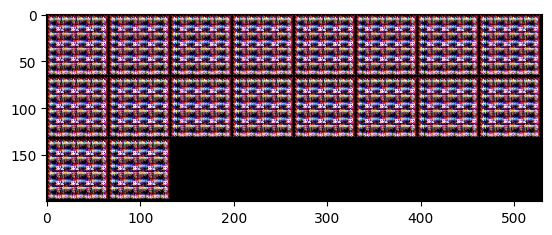

100%|██████████| 103/103 [01:40<00:00,  1.03it/s]


epoch: 1, lossD:1.782448784818927, lossG:3.417333510315534,lossG_fake:1.8844218288810508, lossG_real:1.5329116791197397 ,equality:0.3515101497613111


evaluate:102.33187866210938,kid_mean:0.060178350657224655, kid_std:0.02493487112224102,kid_:(tensor(0.0602), tensor(0.0249))


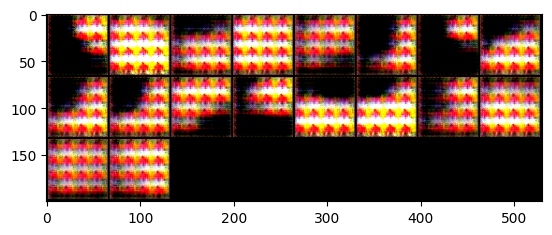

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 2, lossD:1.8755614329310297, lossG:2.550723857092626,lossG_fake:1.336232237445498, lossG_real:1.214491609809468 ,equality:0.12174062763603


evaluate:95.00890350341797,kid_mean:0.05694959685206413, kid_std:0.030407775193452835,kid_:(tensor(0.0569), tensor(0.0304))


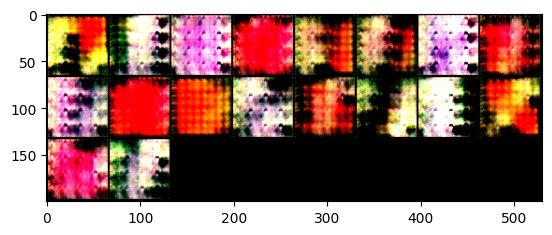

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 3, lossD:2.0465830622367487, lossG:2.0985121333483354,lossG_fake:1.0622686211345265, lossG_real:1.0362435017974632 ,equality:0.026025119337063307


evaluate:95.46892547607422,kid_mean:0.05508102476596832, kid_std:0.03044276311993599,kid_:(tensor(0.0551), tensor(0.0304))


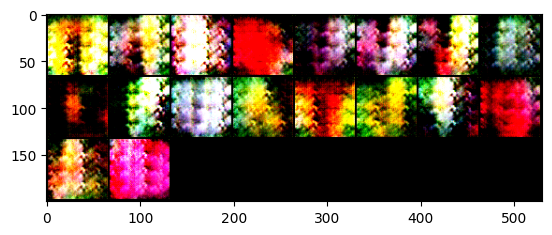

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 4, lossD:2.0066200946141217, lossG:2.083656297146695,lossG_fake:1.0864317689127134, lossG_real:0.997224518396322 ,equality:0.08920725051639145


evaluate:104.26227569580078,kid_mean:0.060416508466005325, kid_std:0.03011261858046055,kid_:(tensor(0.0604), tensor(0.0301))


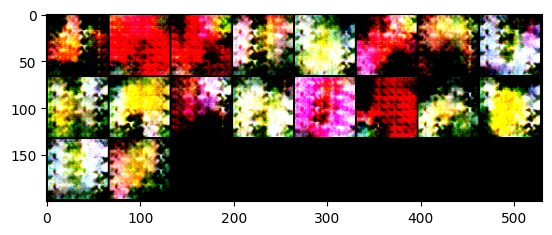

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 5, lossD:2.0403516188408566, lossG:2.0960811874241503,lossG_fake:1.0834854598184234, lossG_real:1.0125957484384185 ,equality:0.07088971138000488


evaluate:96.43645477294922,kid_mean:0.05291629955172539, kid_std:0.027969907969236374,kid_:(tensor(0.0529), tensor(0.0280))


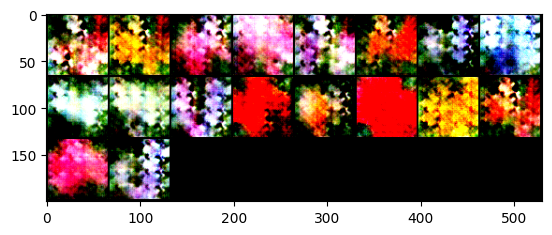

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 6, lossD:2.01910788110159, lossG:2.06974503831956,lossG_fake:1.0715560670037871, lossG_real:0.9981889632141706 ,equality:0.07336710378961653


evaluate:93.05184936523438,kid_mean:0.05658799037337303, kid_std:0.03463135287165642,kid_:(tensor(0.0566), tensor(0.0346))


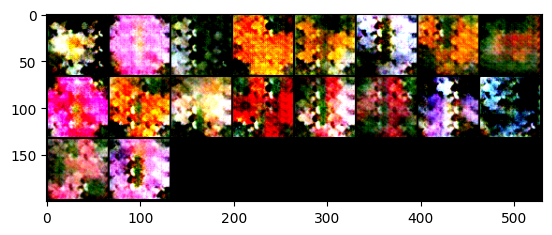

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 7, lossD:2.0288807153701782, lossG:2.069959404399094,lossG_fake:1.061599382497732, lossG_real:1.008360027109535 ,equality:0.05323935538819691


evaluate:96.48542022705078,kid_mean:0.05376788601279259, kid_std:0.02933834306895733,kid_:(tensor(0.0538), tensor(0.0293))


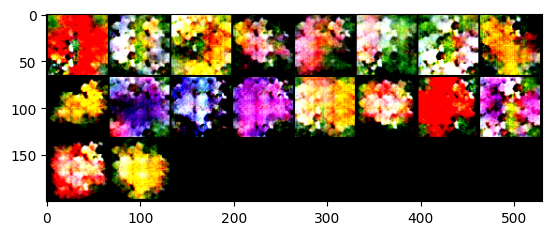

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 8, lossD:2.0162166854710253, lossG:2.046641348635109,lossG_fake:1.0355205958329359, lossG_real:1.0111207499087436 ,equality:0.02439984592419231


evaluate:90.97175598144531,kid_mean:0.0528077632188797, kid_std:0.03205785155296326,kid_:(tensor(0.0528), tensor(0.0321))


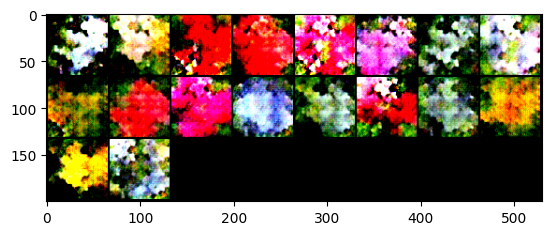

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 9, lossD:2.0174252743859893, lossG:2.039041315467612,lossG_fake:1.0512783041278135, lossG_real:0.9877630003447672 ,equality:0.06351530378304637


evaluate:97.0684814453125,kid_mean:0.055871229618787766, kid_std:0.030341029167175293,kid_:(tensor(0.0559), tensor(0.0303))


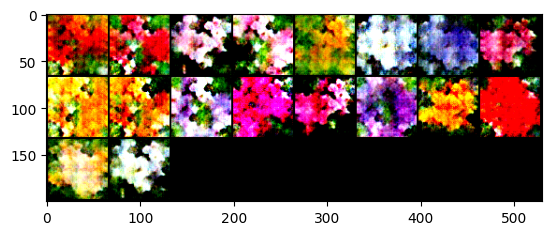

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 10, lossD:2.0353503736477454, lossG:2.078914202532722,lossG_fake:1.0568771790532232, lossG_real:1.0220370194286976 ,equality:0.03484015962452558


evaluate:95.24728393554688,kid_mean:0.05729250982403755, kid_std:0.03212704882025719,kid_:(tensor(0.0573), tensor(0.0321))


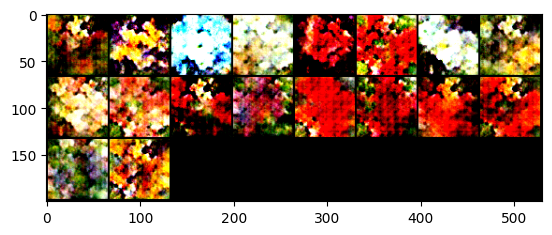

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 11, lossD:2.014009056739437, lossG:2.047523739268479,lossG_fake:1.0419050142603012, lossG_real:1.0056187261655494 ,equality:0.03628628809475187


evaluate:100.70823669433594,kid_mean:0.059013091027736664, kid_std:0.033937156200408936,kid_:(tensor(0.0590), tensor(0.0339))


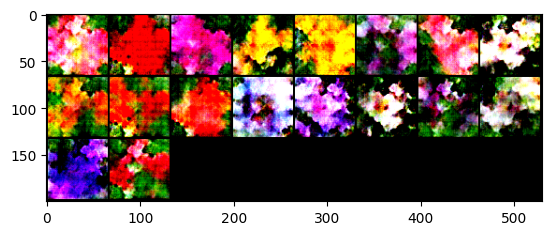

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 12, lossD:2.0076484981092433, lossG:2.0445863992265125,lossG_fake:1.0372374150359516, lossG_real:1.0073489847692472 ,equality:0.029888430266704402


evaluate:104.13932037353516,kid_mean:0.05845652520656586, kid_std:0.03123803623020649,kid_:(tensor(0.0585), tensor(0.0312))


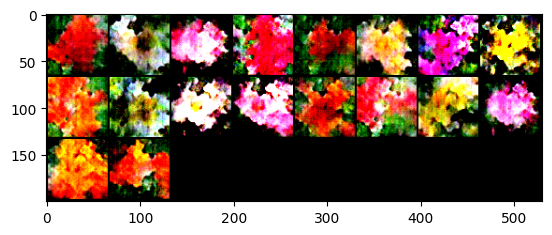

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 13, lossD:2.0054779411519617, lossG:2.0476733990085934,lossG_fake:1.0356105288255562, lossG_real:1.0120628707617232 ,equality:0.023547658063832966


evaluate:106.00031280517578,kid_mean:0.06503691524267197, kid_std:0.033038388937711716,kid_:(tensor(0.0650), tensor(0.0330))


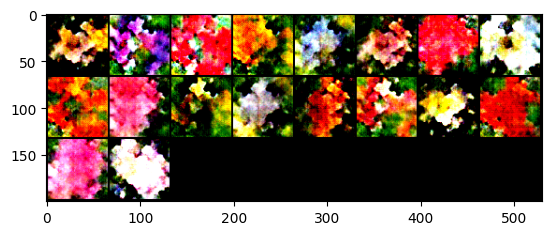

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 14, lossD:2.0066404886616085, lossG:2.0521937770750918,lossG_fake:1.0456254435974417, lossG_real:1.0065683415792521 ,equality:0.03905710201818957


evaluate:109.86561584472656,kid_mean:0.06686060130596161, kid_std:0.038565684109926224,kid_:(tensor(0.0669), tensor(0.0386))


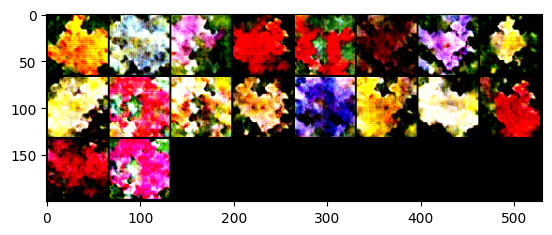

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 15, lossD:2.0221163173323697, lossG:2.0604632155409135,lossG_fake:1.0568231726155697, lossG_real:1.0036400359811135 ,equality:0.053183136634456174


evaluate:112.4063491821289,kid_mean:0.07172665745019913, kid_std:0.03648985177278519,kid_:(tensor(0.0717), tensor(0.0365))


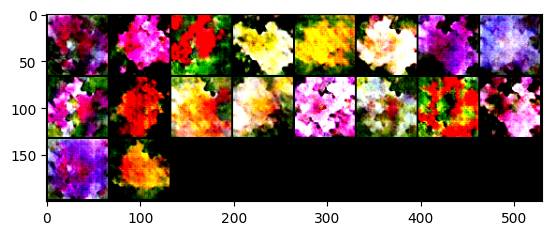

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 16, lossD:2.006450212117538, lossG:2.057920835550549,lossG_fake:1.0513868881660757, lossG_real:1.0065339543287037 ,equality:0.04485293383737199


evaluate:112.05501556396484,kid_mean:0.07260407507419586, kid_std:0.0325055830180645,kid_:(tensor(0.0726), tensor(0.0325))


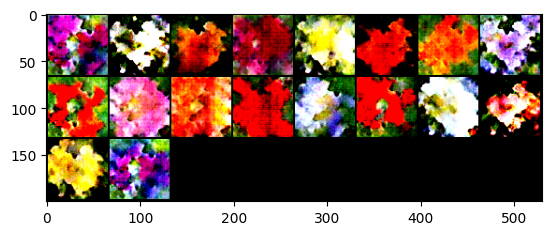

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 17, lossD:2.0028643133570845, lossG:2.045754029912856,lossG_fake:1.047208872234937, lossG_real:0.9985451640434635 ,equality:0.04866370819147359


evaluate:112.69219207763672,kid_mean:0.07426378130912781, kid_std:0.0385710671544075,kid_:(tensor(0.0743), tensor(0.0386))


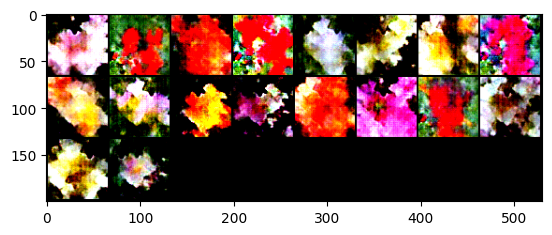

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 18, lossD:2.003301546411607, lossG:2.0592274457505604,lossG_fake:1.0375372287139153, lossG_real:1.021690209513729 ,equality:0.015847019200186274


evaluate:111.0859603881836,kid_mean:0.06788863241672516, kid_std:0.033572547137737274,kid_:(tensor(0.0679), tensor(0.0336))


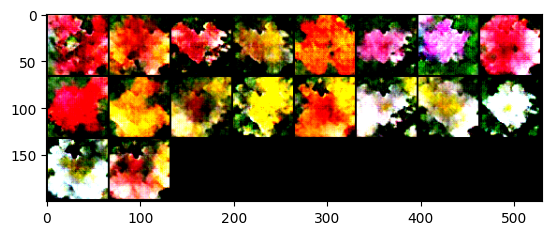

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 19, lossD:2.0159560522986846, lossG:2.082390931046125,lossG_fake:1.062531797631273, lossG_real:1.0198591438311975 ,equality:0.042672653800075455


evaluate:109.17443084716797,kid_mean:0.08351926505565643, kid_std:0.04061102122068405,kid_:(tensor(0.0835), tensor(0.0406))


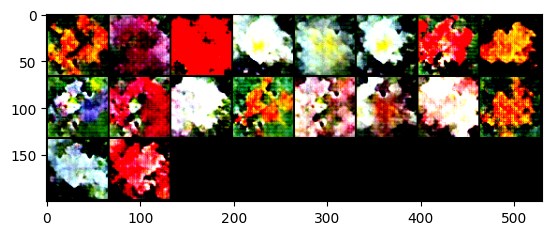

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 20, lossD:2.0005009567853316, lossG:2.0592875619536466,lossG_fake:1.0387498672726085, lossG_real:1.0205376998892108 ,equality:0.018212167383397704


evaluate:104.6820297241211,kid_mean:0.07370717078447342, kid_std:0.0406874418258667,kid_:(tensor(0.0737), tensor(0.0407))


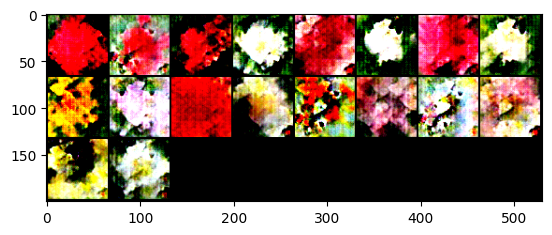

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 21, lossD:2.0015546893610536, lossG:2.108184576034546,lossG_fake:1.0866712800507408, lossG_real:1.021513306400151 ,equality:0.06515797365058984


evaluate:106.57942962646484,kid_mean:0.0733172595500946, kid_std:0.04009409248828888,kid_:(tensor(0.0733), tensor(0.0401))


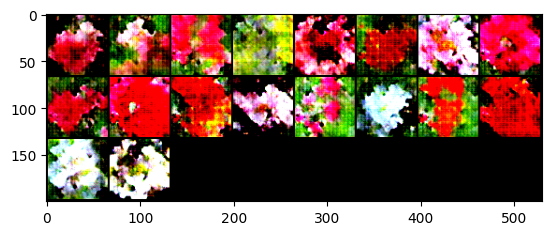

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 22, lossD:1.9904288655345879, lossG:2.0700040210797948,lossG_fake:1.0502204553594867, lossG_real:1.0197835587760777 ,equality:0.03043689658340898


evaluate:106.5321044921875,kid_mean:0.07245240360498428, kid_std:0.034311775118112564,kid_:(tensor(0.0725), tensor(0.0343))


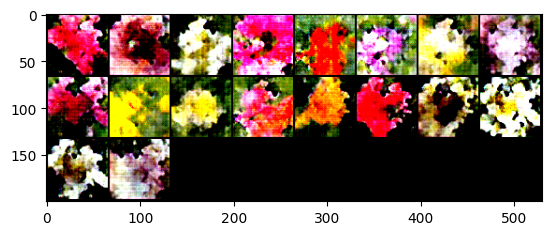

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 23, lossD:2.0036276960835875, lossG:2.113718380048437,lossG_fake:1.0925721560867088, lossG_real:1.021146229748587 ,equality:0.07142592633812184


evaluate:104.23824310302734,kid_mean:0.07279497385025024, kid_std:0.038103118538856506,kid_:(tensor(0.0728), tensor(0.0381))


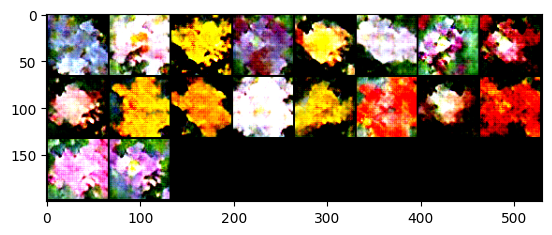

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 24, lossD:2.0092681194972064, lossG:2.0863518113071478,lossG_fake:1.0682020748703225, lossG_real:1.0181497213909927 ,equality:0.05005235347932979


evaluate:106.75856018066406,kid_mean:0.08004409819841385, kid_std:0.04145996645092964,kid_:(tensor(0.0800), tensor(0.0415))


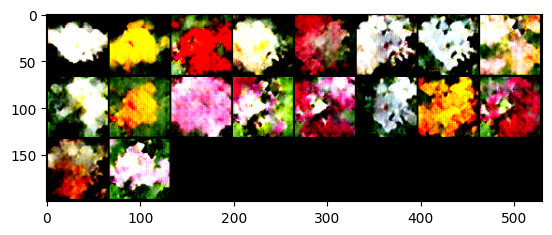

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 25, lossD:1.996155308288278, lossG:2.092530482023665,lossG_fake:1.080285677632082, lossG_real:1.0122448084423843 ,equality:0.06804086918969765


evaluate:107.27305603027344,kid_mean:0.08069533109664917, kid_std:0.03678939491510391,kid_:(tensor(0.0807), tensor(0.0368))


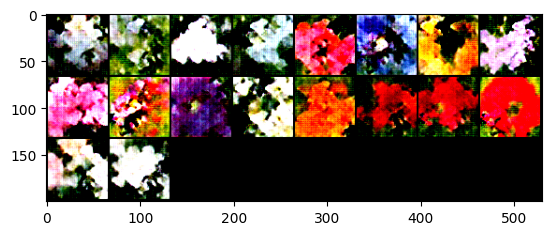

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 26, lossD:1.9904132514324002, lossG:2.11543867310274,lossG_fake:1.0868009716561697, lossG_real:1.0286377083908007 ,equality:0.058163263265369025


evaluate:106.04116821289062,kid_mean:0.07466349005699158, kid_std:0.043145161122083664,kid_:(tensor(0.0747), tensor(0.0431))


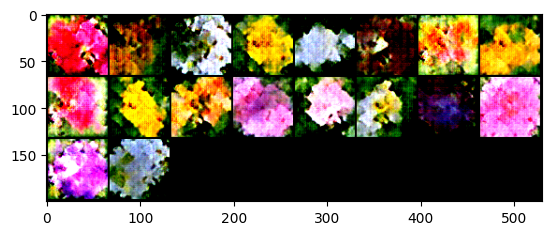

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 27, lossD:1.9876756332453014, lossG:2.1126521004056467,lossG_fake:1.0741565464769753, lossG_real:1.0384955458270693 ,equality:0.03566100064990607


evaluate:106.25189971923828,kid_mean:0.08284784108400345, kid_std:0.041316233575344086,kid_:(tensor(0.0828), tensor(0.0413))


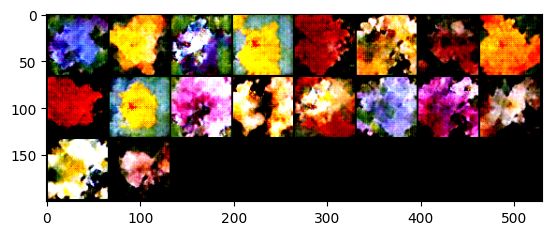

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 28, lossD:1.9801887852474325, lossG:2.120411946935561,lossG_fake:1.1009573953822978, lossG_real:1.0194545544466926 ,equality:0.08150284093560511


evaluate:106.99110412597656,kid_mean:0.0774279534816742, kid_std:0.04059583321213722,kid_:(tensor(0.0774), tensor(0.0406))


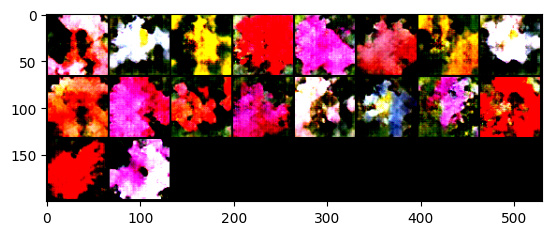

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 29, lossD:1.9753546263407735, lossG:2.1340135393790827,lossG_fake:1.0978207935407325, lossG_real:1.0361927371580624 ,equality:0.061628056382670104


evaluate:105.46659851074219,kid_mean:0.0680316910147667, kid_std:0.034983836114406586,kid_:(tensor(0.0680), tensor(0.0350))


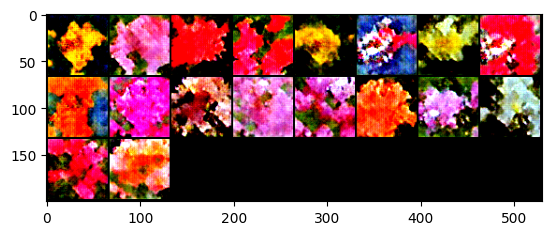

100%|██████████| 103/103 [01:40<00:00,  1.02it/s]


epoch: 30, lossD:1.9861180863334138, lossG:2.1522237814745857,lossG_fake:1.1109402984091379, lossG_real:1.0412834709130445 ,equality:0.06965682749609337


evaluate:105.82644653320312,kid_mean:0.07412567734718323, kid_std:0.033085793256759644,kid_:(tensor(0.0741), tensor(0.0331))


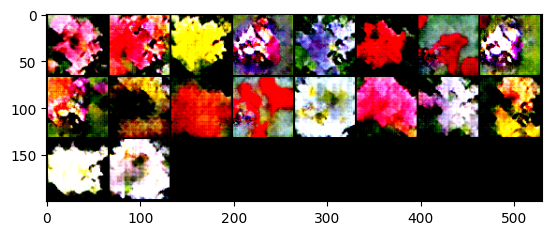

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 31, lossD:1.9800601410634309, lossG:2.1324105378493523,lossG_fake:1.1185403662977866, lossG_real:1.0138701628712774 ,equality:0.10467020342650923


evaluate:106.41895294189453,kid_mean:0.07803714275360107, kid_std:0.04034500941634178,kid_:(tensor(0.0780), tensor(0.0403))


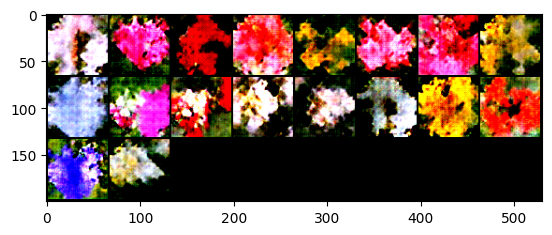

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 32, lossD:1.9765232199604073, lossG:2.146721254274683,lossG_fake:1.087604153503492, lossG_real:1.0591170972990758 ,equality:0.02848705620441616


evaluate:106.66397094726562,kid_mean:0.07892400026321411, kid_std:0.04604119807481766,kid_:(tensor(0.0789), tensor(0.0460))


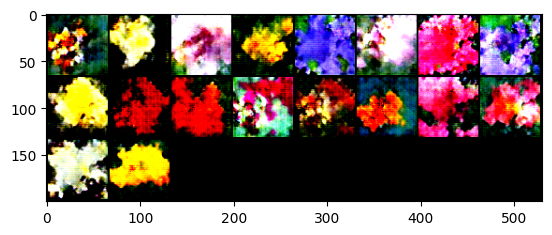

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 33, lossD:1.9649276293597175, lossG:2.180497174124116,lossG_fake:1.1304632946125512, lossG_real:1.0500338881918527 ,equality:0.08042940642069851


evaluate:105.843994140625,kid_mean:0.07404719293117523, kid_std:0.03886452689766884,kid_:(tensor(0.0740), tensor(0.0389))


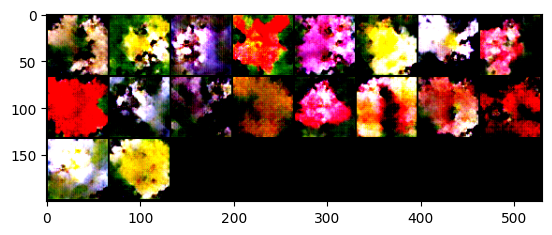

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 34, lossD:1.9705186248982993, lossG:2.205355266922886,lossG_fake:1.1276686700802405, lossG_real:1.0776865927918444 ,equality:0.0499820772883961


evaluate:105.44139099121094,kid_mean:0.06988804042339325, kid_std:0.03445558249950409,kid_:(tensor(0.0699), tensor(0.0345))


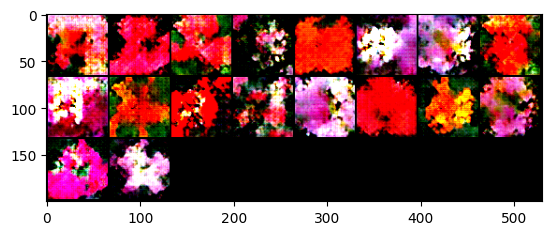

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 35, lossD:1.954688270115158, lossG:2.2669467995467696,lossG_fake:1.1579432227079152, lossG_real:1.1090035907273155 ,equality:0.048939631980599696


evaluate:106.92523193359375,kid_mean:0.07583554089069366, kid_std:0.041002027690410614,kid_:(tensor(0.0758), tensor(0.0410))


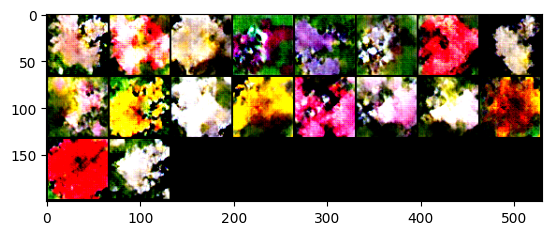

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 36, lossD:1.9292585942351703, lossG:2.282591275798464,lossG_fake:1.1809253229678256, lossG_real:1.1016659447290365 ,equality:0.07925937823878915


evaluate:108.4437026977539,kid_mean:0.07690467685461044, kid_std:0.035439055413007736,kid_:(tensor(0.0769), tensor(0.0354))


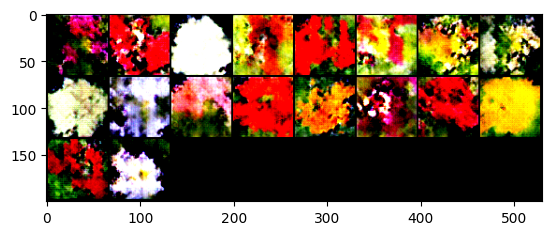

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 37, lossD:1.8979703581448897, lossG:2.3498463144580137,lossG_fake:1.209304257503991, lossG_real:1.1405420662129966 ,equality:0.06876219129099437


evaluate:107.21881866455078,kid_mean:0.07634642720222473, kid_std:0.04017801955342293,kid_:(tensor(0.0763), tensor(0.0402))


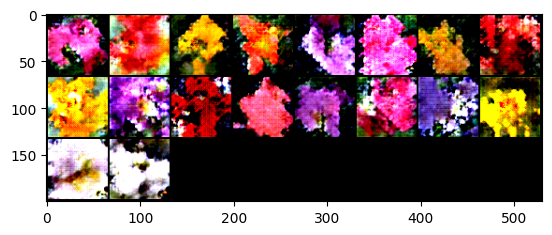

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 38, lossD:1.873699372254529, lossG:2.439476325673964,lossG_fake:1.2604640774356508, lossG_real:1.179012237243282 ,equality:0.08145184019236873


evaluate:107.59563446044922,kid_mean:0.07140036672353745, kid_std:0.04026227444410324,kid_:(tensor(0.0714), tensor(0.0403))


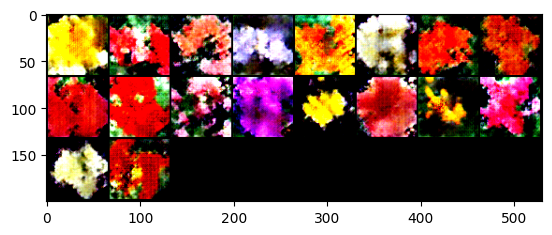

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 39, lossD:1.7973931935227032, lossG:2.52912888712096,lossG_fake:1.2927809409724855, lossG_real:1.236347942676359 ,equality:0.05643299829612647


evaluate:107.41947174072266,kid_mean:0.0739087462425232, kid_std:0.04043402150273323,kid_:(tensor(0.0739), tensor(0.0404))


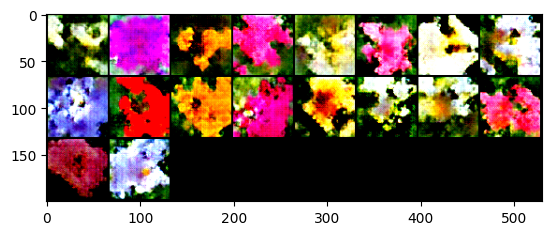

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 40, lossD:1.7561961042070853, lossG:2.675378438338493,lossG_fake:1.3746080965671725, lossG_real:1.3007703452434354 ,equality:0.07383775132373716


evaluate:105.54041290283203,kid_mean:0.07030346989631653, kid_std:0.03992607071995735,kid_:(tensor(0.0703), tensor(0.0399))


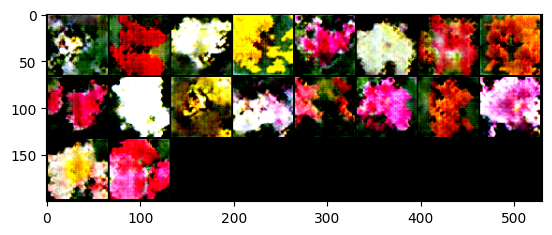

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 41, lossD:1.6945836463020842, lossG:2.8296630914928844,lossG_fake:1.4526381214845527, lossG_real:1.3770249572772424 ,equality:0.07561316420731035


evaluate:106.74263763427734,kid_mean:0.07381131500005722, kid_std:0.03640711307525635,kid_:(tensor(0.0738), tensor(0.0364))


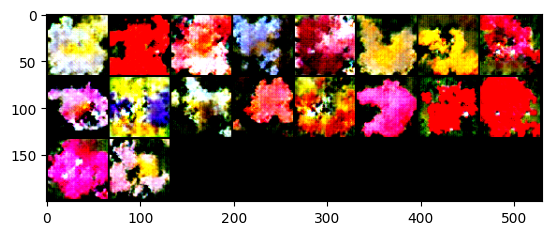

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 42, lossD:1.5982962927772004, lossG:3.126409030655055,lossG_fake:1.6142329081748297, lossG_real:1.5121761247949692 ,equality:0.10205678337986046


evaluate:105.89126586914062,kid_mean:0.07508789747953415, kid_std:0.03650698438286781,kid_:(tensor(0.0751), tensor(0.0365))


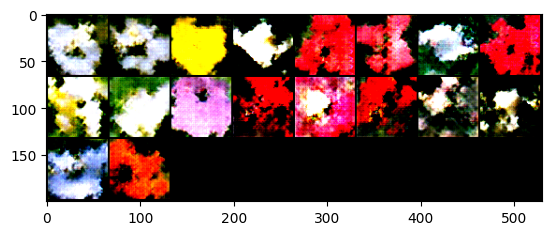

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 43, lossD:1.4021397123059023, lossG:3.4845796557306086,lossG_fake:1.7935152979730402, lossG_real:1.6910643461838508 ,equality:0.10245095178918939


evaluate:106.68103790283203,kid_mean:0.07205493003129959, kid_std:0.03460913151502609,kid_:(tensor(0.0721), tensor(0.0346))


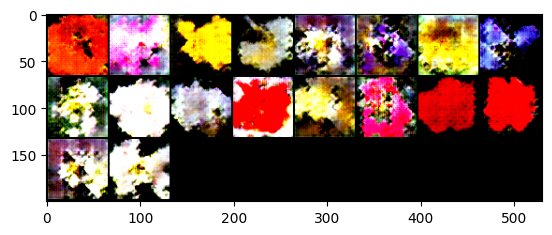

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 44, lossD:1.3319956752860431, lossG:3.8081897902257236,lossG_fake:1.9890568707753153, lossG_real:1.8191329119274917 ,equality:0.16992395884782363


evaluate:106.20420837402344,kid_mean:0.07110290229320526, kid_std:0.03542502596974373,kid_:(tensor(0.0711), tensor(0.0354))


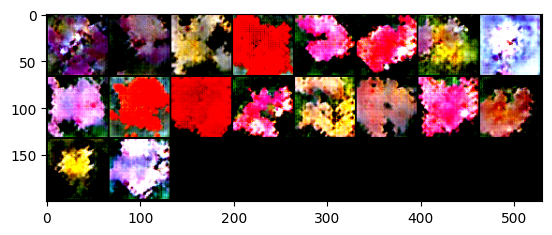

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 45, lossD:1.175693870748131, lossG:4.113040148633198,lossG_fake:2.1479413150583655, lossG_real:1.9650988480419789 ,equality:0.18284246701638662


evaluate:105.43733215332031,kid_mean:0.0729575827717781, kid_std:0.03855709731578827,kid_:(tensor(0.0730), tensor(0.0386))


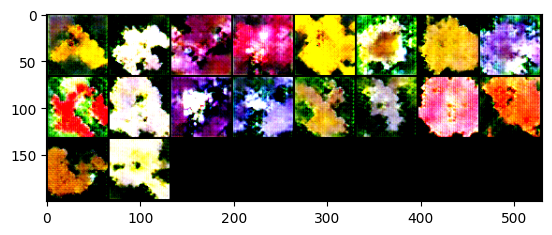

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 46, lossD:1.0487904881389396, lossG:4.433666305634582,lossG_fake:2.3118489153176833, lossG_real:2.121817393210328 ,equality:0.1900315221073554


evaluate:105.08051300048828,kid_mean:0.07012681663036346, kid_std:0.03619604557752609,kid_:(tensor(0.0701), tensor(0.0362))


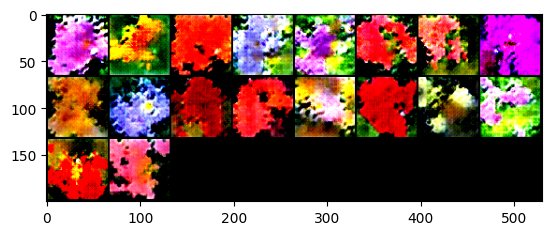

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 47, lossD:0.849233771412118, lossG:4.992029977076262,lossG_fake:2.574590387853604, lossG_real:2.4174395915374016 ,equality:0.15715079631620243


evaluate:104.71624755859375,kid_mean:0.07203295081853867, kid_std:0.03593127802014351,kid_:(tensor(0.0720), tensor(0.0359))


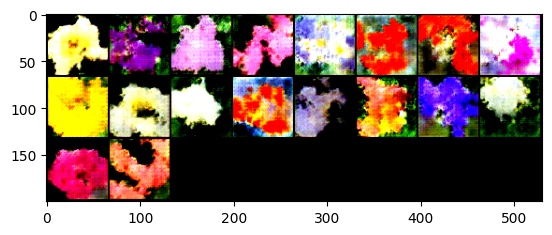

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 48, lossD:0.7843736064376183, lossG:5.173225861151241,lossG_fake:2.6951056082271836, lossG_real:2.4781202569748593 ,equality:0.21698535125232432


evaluate:105.33164978027344,kid_mean:0.07176580280065536, kid_std:0.03945748507976532,kid_:(tensor(0.0718), tensor(0.0395))


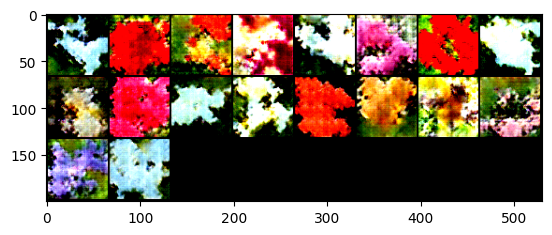

100%|██████████| 103/103 [01:41<00:00,  1.02it/s]


epoch: 49, lossD:0.6907940344903075, lossG:5.388024121812246,lossG_fake:2.801231864586617, lossG_real:2.5867922659059173 ,equality:0.21443959868069973


evaluate:107.04450988769531,kid_mean:0.07429401576519012, kid_std:0.03760480508208275,kid_:(tensor(0.0743), tensor(0.0376))


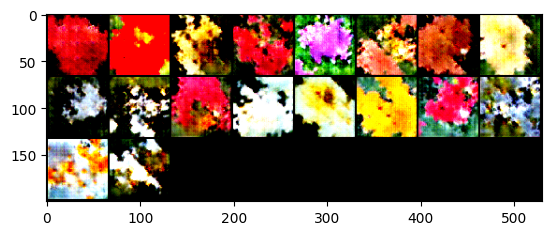

In [ ]:
lossesD = []
lossesG = []

raw_lossesD = []
raw_lossesG = []
lossesG_fake = []
lossesG_real = []

equality = 0.0
sum_equality = 0.0
d_equality = []

relu = torch.nn.ReLU()

fid_ = []
kid_mean_ = []
kid_std_ = []
kid_score = []
for epoch in range(opt.n_epoch):
    running_lossD = 0.0 #損失関数初期化
    running_lossG = 0.0
    lossG_fake_running = 0.0
    lossG_real_running = 0.0

    #sum_equality += equality
    equality = 0.0
   # for i , (real_imgs, _) in enumerate(tqdm.tqdm(dataloader, position = 0)):#celebA
    for i , real_imgs in enumerate(tqdm.tqdm(dataloader, position = 0)):#flower
        real_imgs = real_imgs.to(device)
        batch_size = real_imgs.size()[0]
        noise = torch.randn(batch_size, opt.z_dim, 1, 1).to(device)

        #train discriminator

        netD.zero_grad()
        output_real = netD(real_imgs)

        #lossD_real = criterion(output, labels_real)
        lossD_real = torch.mean(relu(1.0 - output_real))


        fake_imgs = netG(noise)##not train  output_fake_d
        output_fake_d = netD(fake_imgs.detach())#not train  output_fake_d

        #lossD_fake = criterion(output, labels_fake)
        lossD_fake = torch.mean(relu(1.0 + output_fake_d))


        lossD = lossD_real + lossD_fake
        #lossD = torch.mean(torch.log(torch.sigmoid(output_real)))- torch.mean(torch.log(torch.sigmoid(output_fake_d)))  #not train  output_fake_d
        lossD.backward()
        optimizerD.step()

        #train generator

        netG.zero_grad()#勾配初期

        output_fake_g = netD(fake_imgs)#train  output_fake_g
        output_real = netD(real_imgs)

        lossG_fake = torch.mean(relu(1.0 - output_fake_g))
        lossG_real = torch.mean(relu(1.0 + output_real))
        #lossG =  torch.mean(torch.log(torch.sigmoid(output_fake_g - output_real))) #- torch.mean(torch.log(torch.sigmoid(output_real)))#train  output_fake_g
        lossG =    lossG_real + lossG_fake


        lossG.backward()
        optimizerG.step()

        # save loss

        running_lossD += lossD.item()
        running_lossG += lossG.item()

        raw_lossesD.append(lossD.item())
        raw_lossesG.append(lossG.item())

        lossG_fake_running += lossG_fake.item()
        lossG_real_running += lossG_real.item()



    running_lossD /=len(dataloader)
    running_lossG /=len(dataloader)

    lossG_fake_running /= len(dataloader)
    lossG_real_running /= len(dataloader)
#equality
    equality = ( lossG_fake_running - lossG_real_running  )
    d_equality.append(equality)


    print("epoch: {}, lossD:{}, lossG:{},lossG_fake:{}, lossG_real:{} ,equality:{}".format(epoch, running_lossD, running_lossG,lossG_fake_running,lossG_real_running,equality))#-->,lossG_fake:{}, lossG_real:{},lossG_fake_running,lossG_real_running
    lossesD.append(running_lossD)
    lossesG.append(running_lossG)

    lossesG_fake.append(lossG_fake_running)
    lossesG_real.append(lossG_real_running)

     #evaluate GAN
    fake_imgs_1 = fake_imgs.detach()
    real_imgs_1 = real_imgs.to(dtype=torch.uint8).cpu()
    fake_imgs_1 = fake_imgs_1.to(dtype=torch.uint8).cpu()
    fid.update(real_imgs_1, real=True)
    fid.update(fake_imgs_1, real=False)
    eval = fid.compute()

    kid.update(real_imgs_1, real=True)
    kid.update(fake_imgs_1, real=False)
    kid_ = kid.compute()
    kid_mean, kid_std = kid.compute()



    print("evaluate:{},kid_mean:{}, kid_std:{},kid_:{}".format(eval, kid_mean, kid_std, kid_))
    fid_.append(eval)
    kid_mean_.append(kid_mean)
    kid_std_.append(kid_std)
    kid_score.append(kid_)
    #show fake image
    grid_imgs = vutils.make_grid(fake_imgs[:24].detach()+0.5)
    grid_imgs_arr = grid_imgs.cpu().numpy()
    plt.imshow(np.transpose(grid_imgs_arr, (1,2,0)))
    plt.show()

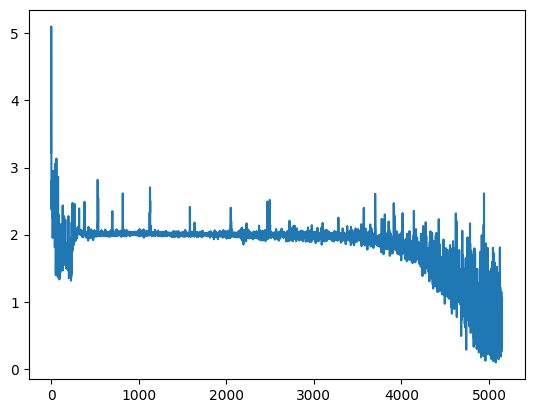

In [ ]:
plt.plot(raw_lossesD)

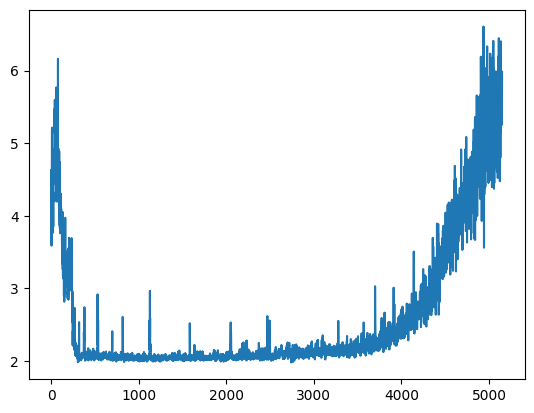

In [ ]:
plt.plot(raw_lossesG)

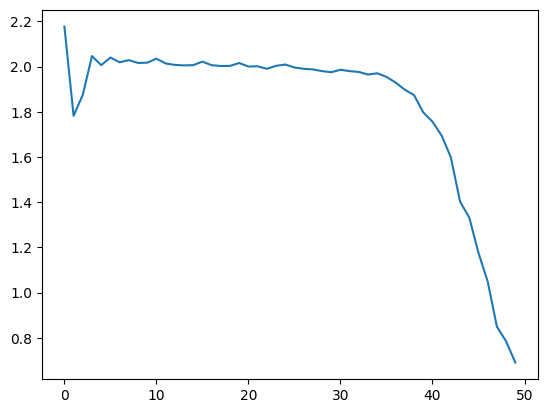

In [ ]:
plt.plot(lossesD)

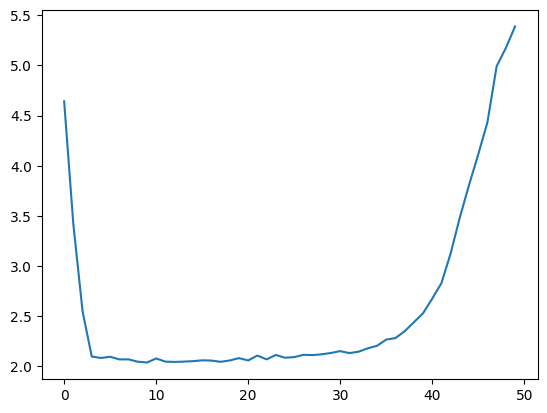

In [ ]:
plt.plot(lossesG)

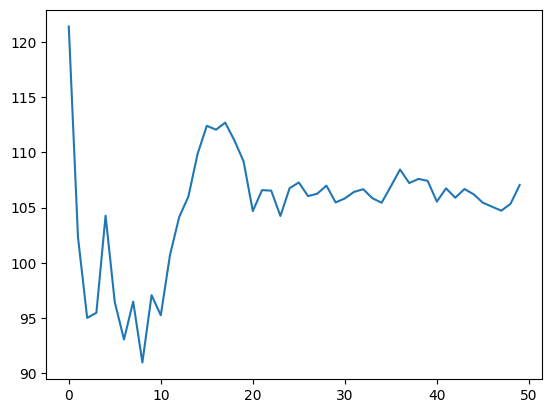

In [ ]:
plt.plot(fid_)

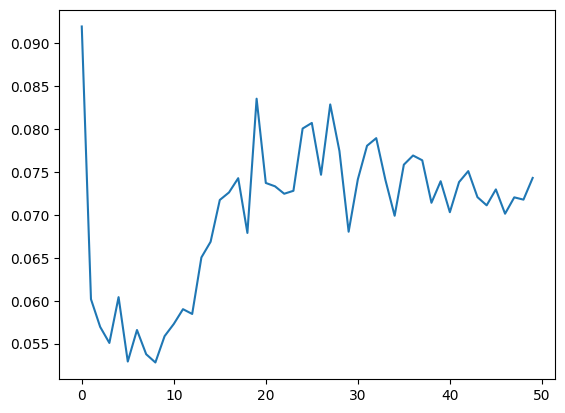

In [ ]:
plt.plot(kid_mean_)

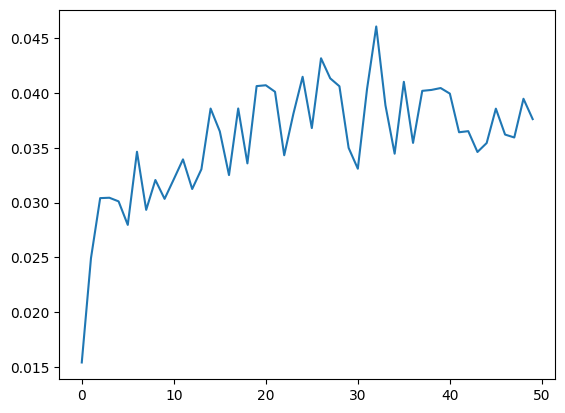

In [ ]:
plt.plot(kid_std_)

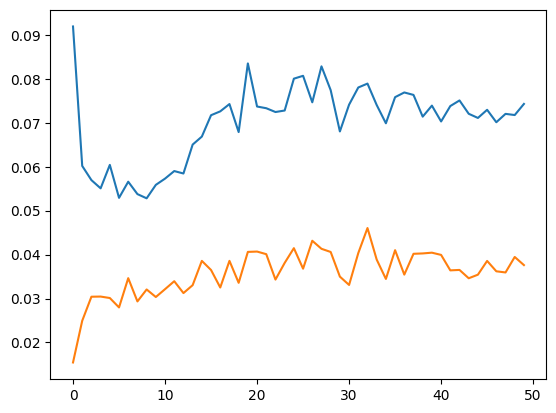

In [ ]:
plt.plot(kid_score)

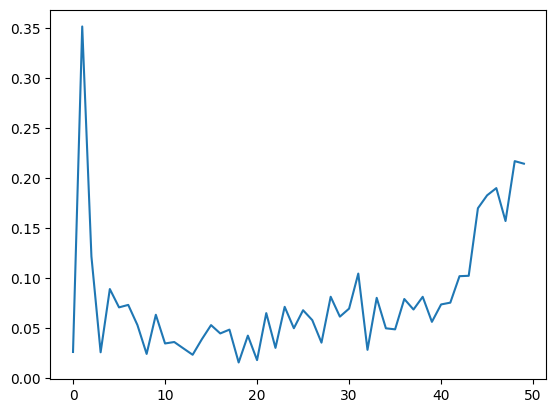

In [ ]:
plt.plot(d_equality)

In [ ]:

import torch
!pip install torcheval


from torcheval.metrics import PeakSignalNoiseRatio
import torch
import torchvision
#from torcheval.metrics import StructuralSimilarity

real_imgs = real_imgs.to(dtype=torch.uint8).cpu()
fake_imgs = fake_imgs.to(dtype=torch.uint8).cpu()
fid.update(real_imgs, real=True)
fid.update(fake_imgs, real=False)
print(f'fid ',fid.compute())

kid.update(real_imgs, real=True)
kid.update(fake_imgs, real=False)
print(f'kid ',kid.compute())

metric = PeakSignalNoiseRatio()
#input = torch.tensor([[0.1, 0.2], [0.3, 0.4]])
#>>> target = input * 0.9
metric.update(fake_imgs,real_imgs)
print(f'PSNR',metric.compute())#高いほどいい
#PSNR (Peak Signal-to-Noise Ratio): PSNRは、生成画像と本物の画像の間のノイズの量を測定します。高いPSNRは、より低いノイズレベルを示します。

import torch
from skimage.metrics import structural_similarity as ssim
import numpy as np

# 例えば、real_imageが与えられているとします
real_image =real_imgs # 仮のランダムな画像データ
fake_image =fake_imgs
# PyTorch TensorをNumPy配列に変換
real_image_np = real_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
real_image_np = np.clip((real_image_np + 1) / 2.0, 0, 1)

# PyTorch TensorをNumPy配列に変換
fake_image_np = fake_image.cpu().numpy()

# SSIMを計算するために、0から1の範囲に正規化することが推奨されます
fake_image_np = np.clip((fake_image_np + 1) / 2.0, 0, 1)

# SSIMを計算
ssim_value = ssim(real_image_np[0], fake_image_np[0], win_size=3)
print(f"SSIM値: {ssim_value}")
#SSIMは、画像の品質を評価するための指標であり、生成画像と本物の画像の構造的な類似性を測定します。1に近い値が高い品質を示します。

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 3.8 MB/s eta 0:00:00
fid  tensor(108.6931)
kid  (tensor(0.0705), tensor(0.0395))
PSNR tensor(69.2586)
SSIM値: 0.9873873026748885
